In [41]:
pip install google_trans_new

Note: you may need to restart the kernel to use updated packages.


In [129]:
pip install folium

     |████████████████████████████████| 102kB 109kB/s a 0:00:011
Note: you may need to restart the kernel to use updated packages.


In [219]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import json as js
import ast
import re
import networkx as nx
from datetime import datetime
from google_trans_new import google_translator  
import folium
from folium import plugins
from folium.plugins import HeatMap
import math

In [165]:
# open file as a dataframe
with open(r"corona_tweets_09_includes.tweets.txt", encoding="utf8") as corona_file:
    tw=[]
    line= corona_file.readlines()
    for row in range(len(line)):
        temp = ast.literal_eval(line[row])
        tw.append(temp)

    tws_df=pd.DataFrame(tw)
    #print(tws_df.head())

In [6]:
with open(r"places.txt", encoding="utf8") as places_file:
    p=[]
    line= places_file.readlines()
    for row in range(len(line)):
        temp = ast.literal_eval(line[row])
        p.append(temp)

    places_df=pd.DataFrame(p)
    print(places_df.head())

      country country_code              full_name  \
0   Allemagne           DE  Düsseldorf, Allemagne   
1  Etats-Unis           US          Manhattan, NY   
2  Etats-Unis           US       Connecticut, USA   
3        Inde           IN        नई दिल्ली, भारत   
4  Etats-Unis           US        Albuquerque, NM   

                                                 geo                id  \
0  {'type': 'Feature', 'bbox': [6.688728, 51.1243...  b7d3c12268abd20e   
1  {'type': 'Feature', 'bbox': [-74.026675, 40.68...  01a9a39529b27f36   
2  {'type': 'Feature', 'bbox': [-73.727776, 40.95...  e86b380cfefcced5   
3  {'type': 'Feature', 'bbox': [76.84252, 28.3976...  317fcc4b21a604d5   
4  {'type': 'Feature', 'bbox': [-106.7916912, 35....  813a485b26b8dae2   

          name place_type  
0   Düsseldorf       city  
1    Manhattan       city  
2  Connecticut      admin  
3    नई दिल्ली       city  
4  Albuquerque       city  


In [9]:
print(places_df.columns)

Index(['country', 'country_code', 'full_name', 'geo', 'id', 'name',
       'place_type'],
      dtype='object')


# Join tweets and places files on place_id

In [12]:
places_df.rename(columns={'id':'place_id'}, inplace=True)

In [15]:
#helper function to get place_id
def get_place_id(df):
    #check if there is geo info
    if isinstance(df.loc['geo'],float):
        return 0
    elif 'place_id' in df['geo']:
        return df['geo'].get('place_id')
    else:
        return 0

#make an empty column and apply the function 
tws_df['place_id'] = np.NaN
tws_df['place_id'] = tws_df.apply(get_place_id, axis=1)

In [26]:
#left joib on place_id
result_df = pd.merge(tws_df, places_df, how = 'left', on=["place_id"])
print(result_df.shape)

In [27]:
#keep only those with geo information: now only have 19396 rows
result_df_geo = result_df[result_df['place_id'] != 0]
result_df_geo.shape

(19396, 22)

## Tranlate source languages to English

In [29]:
print(result_df_geo.head())
#note: there are non-English names, need to translate them to English for consistency

                                   attachments           author_id  \
62                                         NaN           614156493   
66                                         NaN          3201537466   
108                                        NaN  770284073805815819   
130                                        NaN            88145247   
138  {'media_keys': ['7_1243071342204854274']}           474221907   

                                   context_annotations  \
62   [{'domain': {'id': '123', 'name': 'Ongoing New...   
66   [{'domain': {'id': '123', 'name': 'Ongoing New...   
108  [{'domain': {'id': '123', 'name': 'Ongoing New...   
130  [{'domain': {'id': '10', 'name': 'Person', 'de...   
138  [{'domain': {'id': '123', 'name': 'Ongoing New...   

                   created_at  \
62   2020-03-26T05:49:33.000Z   
66   2020-03-24T14:46:49.000Z   
108  2020-03-23T16:51:05.000Z   
130  2020-03-26T06:41:18.000Z   
138  2020-03-26T07:04:49.000Z   

                               

In [30]:
#show all countries in the df
country_list = result_df_geo['country'].unique()
print(country_list)

['Inde' 'South Africa' 'Etats-Unis' 'Ghana' 'Nigeria' 'Nouvelle-Zélande'
 'République des Philippines' 'Ouganda' 'Emirats Arabes Unis' 'Kenya'
 'Pakistan' 'Namibie' 'Népal' 'Royaume-Uni' 'Zimbabwe' 'Indonésie' 'Suède'
 "Royaume d'Arabie Saoudite" 'Sri Lanka' 'Jamaïque'
 'République populaire de Chine' "Côte d'Ivoire" 'Australia' 'Tanzanie'
 'Espagne' 'Afghanistan' 'Allemagne' 'Japon' 'Suisse' 'Irlande' 'Géorgie'
 'Malaisie' 'Zambie' 'Canada' 'Thaïlande' 'Botswana' 'Pays-Bas' 'Chypre'
 nan 'Belgique' 'Autriche' 'Hong Kong' 'Norvège' 'Senegal' 'Bangladesh'
 'ישראל' 'République Démocratique Du Congo' '' 'Cameroon' 'Koweït'
 'Burundi' 'Algérie' 'Seychelles' 'Gibraltar' 'Iraq' 'Ukraine' 'Fidji'
 'République du Rwanda' 'Turquie' 'Royaume hachémite de Jordanie'
 'Lesotho' 'France' 'Sierra Leone' 'Tunisie' 'Liban' 'Taïwan' 'Estonie'
 'Malawi' 'Libéria' 'Qatar' 'Gambie' 'Egypte' 'Bahreïn' 'Danemark'
 'Portugal' 'Islande' 'Antigua-et-Barbuda' 'Brésil' 'Mexique' 'Aruba'
 'Barbade' 'Syrie' 'Croati

In [59]:
translator = google_translator()  
result_df_geo['country_eng'] = np.NaN
#result_df_geo['country_eng'] = translator.translate(result_df_geo['country'] ,lang_tgt='en')
result_df_geo['country_eng'] = result_df_geo['country'].apply(translator.translate, lang_tgt='en')


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


google_new_transError: Failed to connect. Probable cause: timeout

In [228]:
sample_result_df_geo = result_df_geo.sample(frac= 0.05)

translator = google_translator()  
sample_result_df_geo['country_eng'] = np.NaN
#result_df_geo['country_eng'] = translator.translate(result_df_geo['country'] ,lang_tgt='en')
sample_result_df_geo['country_eng'] = sample_result_df_geo['country'].apply(translator.translate, lang_tgt='en')

In [229]:
sample_result_df_geo.shape

(970, 25)

In [230]:
sample_result_df_geo_nunique = sample_result_df_geo.groupby('country_eng')['id'].nunique()
print(sample_result_df_geo_nunique)

country_eng
Australia                         2
Barbados                          1
Belgium                           1
Botswana                          2
Cameroon                          1
Canada                           10
Congo                             1
Egypt                             1
France                            1
Germany                           2
Ghana                            25
Grenade                           1
Hashemite Kingdom of Jordan       1
Indonesia                         7
Inside                          113
Ireland                           3
Israel                            2
Italy                             2
Jamaica                           2
Kenya                            12
Kingdom of Saudi Arabia           1
Lesotho                           1
Liberia                           1
Malawi                            1
Malaysia                          3
Namibia                           3
Nepal                             1
Netherlands     

Insights: imbalance dataset from the aspects of country

## Only look at cuntries in UTC0

In [69]:
UTC0_list = ['GM','GH','GL','GN','GW','IS','LR','ML','MR','MA','PT','SH','ST','SN','TG','EH'] #hardcode
UTC0_df_geo = result_df[result_df['country_code'].isin(UTC0_list)]
UTC0_df_geo.shape

(843, 22)

Histogram showing time of day when people post tweets

In [71]:
#helper function to convert to hour
def process_time(df):
    time_str = df['created_at'][11:19]
    time_whole = datetime.strptime(time_str, '%H:%M:%S')
    return int(datetime.strftime(time_whole, '%H'))

#Add a hour time column
UTC0_df_geo['time'] = np.NaN
UTC0_df_geo['time'] = UTC0_df_geo.apply(process_time, axis=1)

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


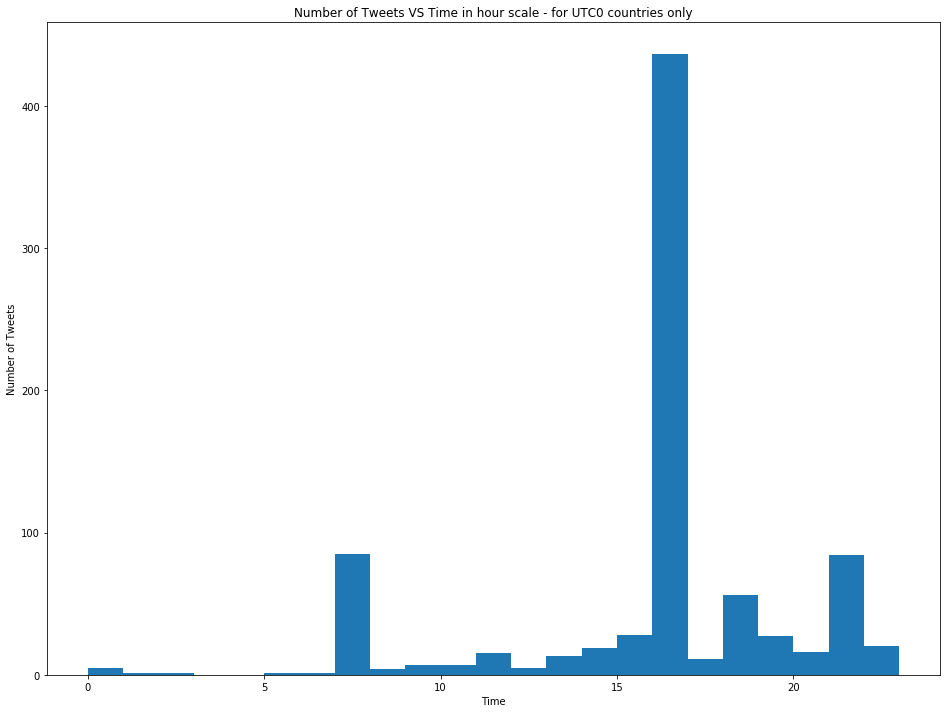

In [72]:
#plot the histogram graph
plt.figure(figsize=(16,12)) 
plt.hist(UTC0_df_geo['time'],bins=range(0, 24, 1) )
plt.xlabel('Time')
plt.ylabel('Number of Tweets')
plt.title('Number of Tweets VS Time in hour scale - for UTC0 countries only')
plt.show()
#not uniform, could be sampling bias

Scatter plot

In [73]:
def count_retweets(df):
    rtw_dic =  df['public_metrics']
    return rtw_dic.get('retweet_count')
    
#make an empty column and apply the function 
UTC0_df_geo['retweets_counts'] = np.NaN
UTC0_df_geo['retweets_counts'] = UTC0_df_geo.apply(count_retweets, axis=1)

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


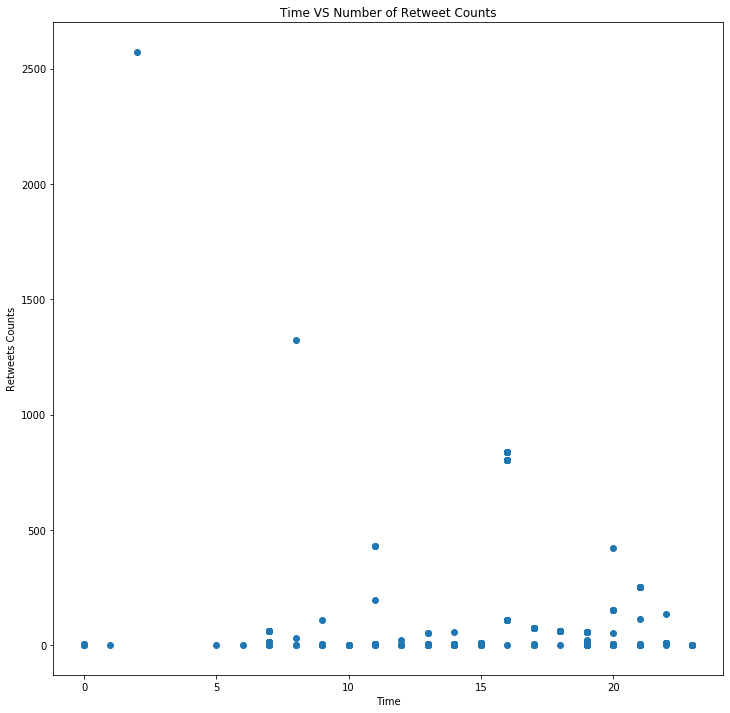

In [75]:
#draw the scatter plot
plt.figure(figsize=(12,12)) 
plt.scatter(UTC0_df_geo['time'],UTC0_df_geo['retweets_counts'])
plt.xlabel('Time')
plt.ylabel('Retweets Counts')
plt.title('Time VS Number of Retweet Counts')
plt.show()

<b>Split into 2 datasets: 0-12,12-24: check the network effects<b>

In [81]:
UTC0_df_geo_1st =  UTC0_df_geo[UTC0_df_geo['time'] <= 12]
UTC0_df_geo_1st.shape

(132, 24)

In [82]:
UTC0_df_geo_2nd =  UTC0_df_geo[UTC0_df_geo['time'] > 12 ]
UTC0_df_geo_2nd.shape

(711, 24)

Note: imbalance - more afternoon and evening tweets

In [180]:
#helper function to append to the reference_dic, use set to avoid double-counting
def add_to_dict(my_dict, id, df):
    set_per_id = set()
    sub_df = df[df['id'] == id]
    sub_df = sub_df.dropna(subset=['referenced_tweets']) #remove NaN
    all_ref = sub_df['referenced_tweets'].tolist()
    for i in all_ref:
        for j in i:
            set_per_id.add(j.get('id'))
    my_dict[id]=set_per_id

In [181]:
#get all unique id for a subset of the dataset (by sampling)
def get_reference_dict(df):
    reference_dic = {}
    #tws_df_sub = tws_df.sample(frac= 0.01)
    id_list = df['id'].unique()

    for my_id in id_list:
        add_to_dict(reference_dic,my_id,df)
    
    return reference_dic

In [233]:
UTC0_df_geo_1st['referenced_tweets']

138                                                     NaN
197                                                     NaN
340                                                     NaN
688                                                     NaN
1351                                                    NaN
1624                                                    NaN
1859                                                    NaN
2179                                                    NaN
2625                                                    NaN
2749                                                    NaN
3253                                                    NaN
3634                                                    NaN
4426                                                    NaN
4556                                                    NaN
5405                                                    NaN
5690                                                    NaN
7345                                    

//anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
//anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


<function matplotlib.pyplot.show(*args, **kw)>

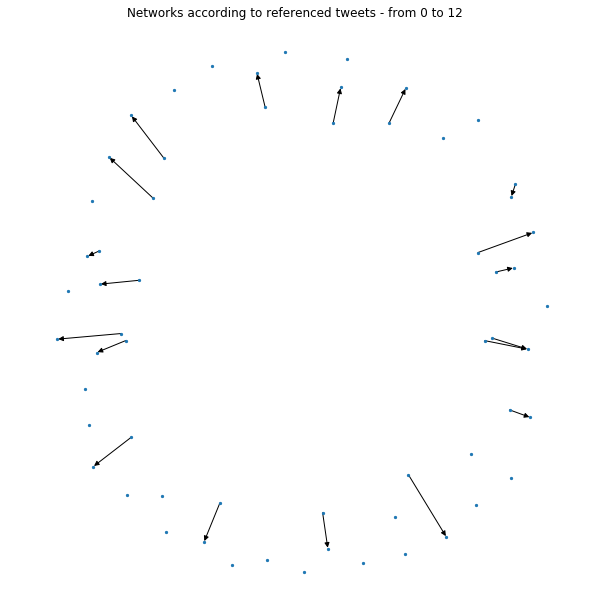

In [182]:
reference_dic_1st = get_reference_dict(UTC0_df_geo_1st)

g = nx.DiGraph()
g.add_nodes_from(reference_dic_1st.keys())

for k, v in reference_dic_1st.items():
    g.add_edges_from(([(k, t) for t in v]))
    
plt.figure(figsize=(8,8)) 
nx.draw(g,node_size=5)
plt.title('Networks according to referenced tweets - from 0 to 12')
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

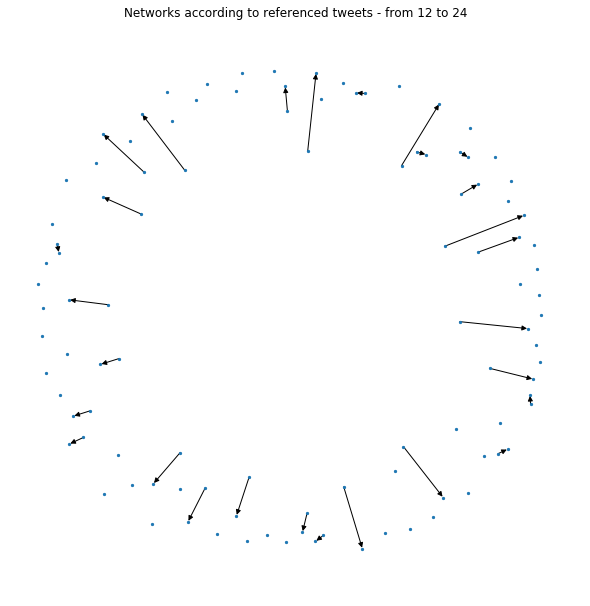

In [183]:
reference_dic_2nd = get_reference_dict(UTC0_df_geo_2nd)

g = nx.DiGraph()
g.add_nodes_from(reference_dic_2nd.keys())

for k, v in reference_dic_2nd.items():
    g.add_edges_from(([(k, t) for t in v]))
    
plt.figure(figsize=(8,8)) 
nx.draw(g,node_size=5)
plt.title('Networks according to referenced tweets - from 12 to 24')
plt.show

In [245]:
print("size of original dic: " + str(len(reference_dic_2nd)))
print("number of id with no reference tweets: "+ str(sum(value == set() for value in reference_dic_2nd.values())))
print("percentage = " + str(sum(value == set() for value in reference_dic_2nd.values())/len(reference_dic_2nd)))

size of original dic: 78
number of id with no reference tweets: 50
percentage = 0.6410256410256411


Insights: more networks effect in the afternoon and evening (maybe because there are more records)

Potentially useful link (dynamic network visualization):https://cambridge-intelligence.com/methods-visualizing-dynamic-networks/

Question: will people be more closed connected when they are in the same time zone? Tested by randomly sampling from data with creation time btw 12 and 24 

In [104]:
result_df['time'] = np.NaN
result_df['time'] = result_df.apply(process_time, axis=1)

randome_sample_df_2nd = result_df[result_df['time'] > 12 ]
randome_sample_df_2nd.shape

(256442, 23)

In [186]:
randome_sample_df_2nd.sample(frac= 0.00277).shape

(710, 23)

<function matplotlib.pyplot.show(*args, **kw)>

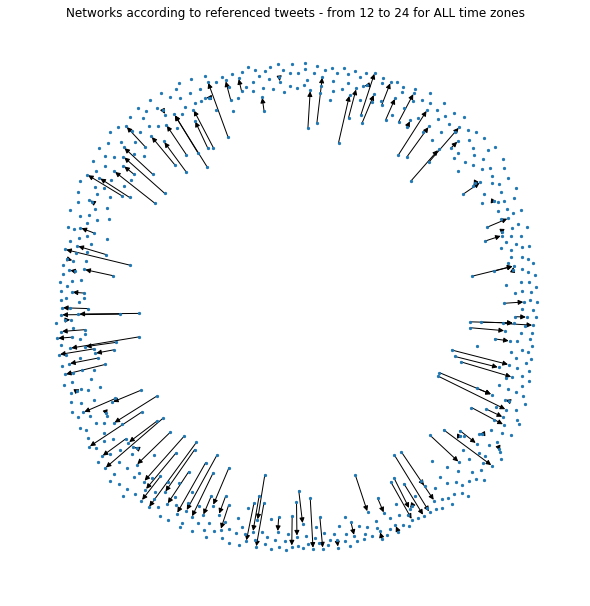

In [184]:
reference_dic_2nd_all = get_reference_dict(randome_sample_df_2nd.sample(frac= 0.00277)) #try to keep the total number constant

g = nx.DiGraph()
g.add_nodes_from(reference_dic_2nd_all.keys())

for k, v in reference_dic_2nd_all.items():
    g.add_edges_from(([(k, t) for t in v]))
    
plt.figure(figsize=(8,8)) 
nx.draw(g,node_size=5)
plt.title('Networks according to referenced tweets - from 12 to 24 for ALL time zones')
plt.show

In [246]:
print("size of original dic: " + str(len(reference_dic_2nd_all)))
print("number of id with no reference tweets: "+ str(sum(value == set() for value in reference_dic_2nd_all.values())))
print("percentage = " + str(sum(value == set() for value in reference_dic_2nd_all.values())/len(reference_dic_2nd_all)))

size of original dic: 543
number of id with no reference tweets: 408
percentage = 0.7513812154696132


Insights: when considering all time zones, the network has more connections (when the total number is around 711)

# Map

In [127]:
#helper function to calculate the average and apply them to all
def average(number1, number2):
    return (number1 + number2) / 2.0

#compute the average data of latitude and lontitude 
places_df['Lontitude'] = places_df.apply(lambda x: average (x['geo']['bbox'][0],x['geo']['bbox'][2]),axis = 1)
places_df['Latitude'] = places_df.apply(lambda x: average (x['geo']['bbox'][1],x['geo']['bbox'][3]),axis = 1)
places_df

,country,country_code,full_name,geo,place_id,name,place_type,Lontitude,Latitude
0,Allemagne,DE,"Düsseldorf, Allemagne","{'type': 'Feature', 'bbox': [6.688728, 51.1243...",b7d3c12268abd20e,Düsseldorf,city,6.814308,51.238447
1,Etats-Unis,US,"Manhattan, NY","{'type': 'Feature', 'bbox': [-74.026675, 40.68...",01a9a39529b27f36,Manhattan,city,-73.968542,40.780709
2,Etats-Unis,US,"Connecticut, USA","{'type': 'Feature', 'bbox': [-73.727776, 40.95...",e86b380cfefcced5,Connecticut,admin,-72.757385,41.500753
3,Inde,IN,"नई दिल्ली, भारत","{'type': 'Feature', 'bbox': [76.84252, 28.3976...",317fcc4b21a604d5,नई दिल्ली,city,77.095086,28.638489
4,Etats-Unis,US,"Albuquerque, NM","{'type': 'Feature', 'bbox': [-106.7916912, 35....",813a485b26b8dae2,Albuquerque,city,-106.632718,35.117003
5,Etats-Unis,US,"Kansas, USA","{'type': 'Feature', 'bbox': [-102.051769, 36.9...",27c45d804c777999,Kansas,admin,-98.319925,38.498196
6,Etats-Unis,US,"Laguna, CA","{'type': 'Feature', 'bbox': [-121.4882357, 38....",947299911720444c,Laguna,city,-121.439383,38.410428
7,Etats-Unis,US,"New Braunfels, TX","{'type': 'Feature', 'bbox': [-98.2149552, 29.6...",c807df9bb77ea0b3,New Braunfels,city,-98.123250,29.705614
8,Etats-Unis,US,"DeWitt, MI","{'type': 'Feature', 'bbox': [-84.6117479, 42.7...",44058dee09d58997,DeWitt,city,-84.572933,42.827637
9,Etats-Unis,US,"Texas, USA","{'type': 'Feature', 'bbox': [-106.645646, 25.8...",e0060cda70f5f341,Texas,admin,-100.076888,31.168893


In [128]:
#left joib on place_id
result_df = pd.merge(tws_df, places_df, how = 'left', on=["place_id"])
print(result_df.shape)

(534546, 24)


In [140]:
#keep only those with geo information: now only have 19396 rows
result_df_geo = result_df[result_df['place_id'] != 0]
result_df_geo.shape

(19396, 24)

In [141]:
#remove NULL Latitude/Lontitude
result_df_geo_map = result_df_geo.dropna(subset = ['Latitude','Lontitude'])
result_df_geo_map.shape

(19371, 24)

In [142]:
#define and initilize a world map
world_map = folium.Map(location=[43.651070, -79.347015], zoom_start=3)

#use the plugin for heat map and convert into the heat value
heatdata = result_df_geo_map[['Latitude','Lontitude']].values.tolist()

# add incidents to map
HeatMap(heatdata).add_to(world_map)

#show the heat map
world_map

In [143]:
#define and initilize a world map
world_map_stats = folium.Map(location=[43.651070, -79.347015], zoom_start=3)

# initialize a mark cluster object for the incidents in the dataframe
number_tweets = plugins.MarkerCluster().add_to(world_map_stats)

# Loop through the twitter places and add each to the incidents feature group
for lat, lng, in zip(result_df_geo_map['Latitude'], result_df_geo_map['Lontitude']):
    number_tweets.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            color='#4966F7',
            fill=True,
            fill_color='grey',
            fill_opacity=0.7
        )
    )

#add the group to the map and show the map
world_map_stats.add_child(number_tweets)

## try to add network in the map

In [ ]:
for key in reference_dic_2nd_all:
    list_network = []
    list_network.append()

In [167]:
#make an empty column and apply the function 
tws_df['place_id'] = np.NaN
tws_df['place_id'] = tws_df.apply(get_place_id, axis=1)

In [169]:
tws_df_with_placeid = tws_df[tws_df['place_id'] != 0 ]
tws_df_with_placeid

,attachments,author_id,context_annotations,created_at,entities,geo,id,in_reply_to_user_id,lang,possibly_sensitive,public_metrics,referenced_tweets,source,text,withheld,place_id
62,NaN,614156493,"[{'domain': {'id': '123', 'name': 'Ongoing New...",2020-03-26T05:49:33.000Z,"{'annotations': [{'start': 216, 'end': 220, 'p...",{'place_id': '7929cea6bd5b32bd'},1243052449524416513,NaN,en,False,"{'retweet_count': 292, 'reply_count': 134, 'li...",NaN,Twitter for iPhone,"Once we overcome the #Corona crisis, the World...",NaN,7929cea6bd5b32bd
66,NaN,3201537466,"[{'domain': {'id': '123', 'name': 'Ongoing New...",2020-03-24T14:46:49.000Z,"{'annotations': [{'start': 0, 'end': 11, 'prob...",{'place_id': 'd0848b8367022de8'},1242462879854612480,NaN,en,False,"{'retweet_count': 2859, 'reply_count': 36, 'li...",NaN,Twitter for Android,Bloemfontein people who attends Devine Restora...,NaN,d0848b8367022de8
108,NaN,770284073805815819,"[{'domain': {'id': '123', 'name': 'Ongoing New...",2020-03-23T16:51:05.000Z,"{'annotations': [{'start': 0, 'end': 2, 'proba...",{'place_id': '531a6942bb8056b9'},1242131768662282243,NaN,en,False,"{'retweet_count': 56186, 'reply_count': 147, '...",NaN,Twitter for iPhone,CDC just announced that corona can be spread v...,NaN,531a6942bb8056b9
130,NaN,88145247,"[{'domain': {'id': '10', 'name': 'Person', 'de...",2020-03-26T06:41:18.000Z,"{'hashtags': [{'start': 154, 'end': 161, 'tag'...",{'place_id': '243cc16f6417a167'},1243065474138525697,NaN,en,False,"{'retweet_count': 27, 'reply_count': 0, 'like_...","[{'type': 'quoted', 'id': '1243060293405560832'}]",Twitter for Android,Taking inspiration from Power Star @PawanKalya...,NaN,243cc16f6417a167
138,{'media_keys': ['7_1243071342204854274']},474221907,"[{'domain': {'id': '123', 'name': 'Ongoing New...",2020-03-26T07:04:49.000Z,"{'hashtags': [{'start': 93, 'end': 103, 'tag':...",{'place_id': '003e299707d0375b'},1243071391047585792,NaN,en,False,"{'retweet_count': 63, 'reply_count': 14, 'like...",NaN,Twitter for iPhone,The chinese are on some different level regard...,NaN,003e299707d0375b
162,{'media_keys': ['3_1243036764937302016']},382625157,NaN,2020-03-26T04:47:15.000Z,"{'urls': [{'start': 27, 'end': 50, 'url': 'htt...",{'place_id': '1661ada9b2b18024'},1243036769525944320,NaN,en,False,"{'retweet_count': 0, 'reply_count': 3, 'like_c...",NaN,Twitter for iPhone,I’m about to make melodies https://t.co/f62Zhc...,NaN,1661ada9b2b18024
192,NaN,770284073805815819,"[{'domain': {'id': '123', 'name': 'Ongoing New...",2020-03-23T16:51:05.000Z,"{'annotations': [{'start': 0, 'end': 2, 'proba...",{'place_id': '531a6942bb8056b9'},1242131768662282243,NaN,en,False,"{'retweet_count': 56186, 'reply_count': 147, '...",NaN,Twitter for iPhone,CDC just announced that corona can be spread v...,NaN,531a6942bb8056b9
197,{'media_keys': ['7_1243071342204854274']},474221907,"[{'domain': {'id': '123', 'name': 'Ongoing New...",2020-03-26T07:04:49.000Z,"{'urls': [{'start': 104, 'end': 127, 'url': 'h...",{'place_id': '003e299707d0375b'},1243071391047585792,NaN,en,False,"{'retweet_count': 63, 'reply_count': 14, 'like...",NaN,Twitter for iPhone,The chinese are on some different level regard...,NaN,003e299707d0375b
229,NaN,88145247,"[{'domain': {'id': '10', 'name': 'Person', 'de...",2020-03-26T06:41:18.000Z,"{'annotations': [{'start': 116, 'end': 122, 'p...",{'place_id': '243cc16f6417a167'},1243065474138525697,NaN,en,False,"{'retweet_count': 27, 'reply_count': 0, 'like_...","[{'type': 'quoted', 'id': '1243060293405560832'}]",Twitter for Android,Taking inspiration from Power Star @PawanKalya...,NaN,243cc16f6417a167
243,NaN,268746755,"[{'domain': {'id': '10', 'name': 'Person', 'de...",2020-03-26T03:33:38.000Z,"{'annotations': [{'start': 111, 'end': 125, 'p...",{'place_id': '52527ff8b69c9692'},1243018247215046656,NaN,en,False,"{'retweet_count': 82, 'reply_count': 1, 'like_...",NaN,Twitter for Android,Janasena Chief @PawanKalyan donates Rs.50 Lakh...,NaN,52527ff8b69c9692


In [170]:
#left joib on place_id
join_result_df = pd.merge(tws_df_with_placeid, places_df, how = 'left', on=["place_id"])
print(join_result_df.shape)

(19396, 24)


In [187]:
#get reference dic
reference_dic_withplaceid = get_reference_dict(join_result_df)
reference_dic_withplaceid

{'1243052449524416513': set(),
 '1242462879854612480': set(),
 '1242131768662282243': set(),
 '1243065474138525697': {'1243060293405560832'},
 '1243071391047585792': set(),
 '1243036769525944320': set(),
 '1243018247215046656': set(),
 '1243070675792932864': set(),
 '1242891047551696903': set(),
 '1242877347969118208': set(),
 '1243060351303892992': {'1242902221941100547'},
 '1242823072530534400': set(),
 '1243061177434816512': {'1243056564467953664'},
 '1242901652417294338': set(),
 '1243033552146571265': set(),
 '1242926432466026497': set(),
 '1242788913913135112': set(),
 '1242920948866650112': set(),
 '1242858052778446848': set(),
 '1243056398256050177': set(),
 '1242849588261933060': set(),
 '1242920816620290057': set(),
 '1243053475149340674': set(),
 '1243048529779621888': {'1243046649506803712'},
 '1242930209029935104': set(),
 '1243068878839853057': {'1243066581971800069'},
 '1239886456266653696': set(),
 '1243002606118526976': {'1243002005322264576'},
 '1242991639460827137': 

In [201]:
join_result_df[join_result_df['id'] == '1243060351303892992'].iloc[0]['Lontitude']

4.5438989

In [221]:
result_list = []
all_id_list = join_result_df['id'].tolist()
for key in reference_dic_withplaceid.keys():
    val = reference_dic_withplaceid.get(key) 
    if val == set():
        continue
    else:
        for set_i in val:
            if set_i not in all_id_list:
                continue
            else:
                Lon = join_result_df[join_result_df['id'] == set_i].iloc[0]['Lontitude']
                Lat = join_result_df[join_result_df['id'] == set_i].iloc[0]['Latitude']
                if math.isnan(Lon) == True or math.isnan(Lat) == True: #remove nan
                    continue
                list_temp = []
                list_temp.append(Lat)
                list_temp.append(Lon)
                result_list.append(list_temp)

In [222]:
result_list

[[30.323345699999997, -97.75472415],
 [6.5344669, 3.52816285],
 [30.864107500000003, 72.35549850000001],
 [-25.86088065, 28.1361401],
 [6.33495475, 5.6412879],
 [7.4290746500000004, 3.9052965],
 [33.739992, -117.8874385],
 [7.4290746500000004, 3.9052965],
 [-26.2485533, 27.945846],
 [6.33495475, 5.6412879],
 [-26.276138500000002, 27.968098050000002],
 [6.33495475, 5.6412879],
 [19.17414, 72.874244],
 [20.188653000000002, 84.440852],
 [0.28926745, 32.56916015],
 [-1.27486335, 36.86362025],
 [8.9424837, 7.2530458],
 [4.69710695, 11.760826250000001],
 [8.9424837, 7.2530458],
 [25.757147, 93.17449049999999],
 [-6.392894500000001, 106.76178150000001],
 [0.28926745, 32.56916015],
 [-6.2665075, 106.71941699999999],
 [5.6231983, -0.18429355],
 [5.6231983, -0.18429355],
 [-26.0197197, 27.95745755],
 [51.5476447, -0.0601675],
 [7.878660200000001, 80.76465395],
 [13.0132185, 80.2176115],
 [12.923114649999999, 77.5584482],
 [6.493112249999999, 3.3386053999999996],
 [40.780709, -73.9685415],
 [26.1

In [236]:
len(result_list)

147

In [224]:
#define and initilize a world map
world_map = folium.Map(location=[43.651070, -79.347015], zoom_start=3)

f1=folium.FeatureGroup("network")

line_1=folium.vector_layers.PolyLine(result_list,tooltip='network',color='blue',weight=5).add_to(f1)

f1.add_to(world_map)

folium.LayerControl().add_to(world_map)

world_map